In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
%matplotlib inline
%load_ext autoreload
%autoreload 2

from common import geo_to_cartesian_m, calculate_centroid_geo

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [19]:
# some random hotspot coordinates (assume altitude of 0)
hs_lla = np.array([[44.304234, -96.780698, 0], [44.320588, -96.912926, 0], [44.293880, -96.812899, 0]]) # n_samples x 3
# Convert to cartesian coordinates
hs_xyz_m = geo_to_cartesian_m(lat_long_alt=hs_lla)

In [22]:
# Calculate the centroid
cartesian_centroid_xyz_m = hs_xyz_m.mean(axis=0)
print(cartesian_centroid_xyz_m)

# Calculate the projected centroid
project_centroid_lla = calculate_centroid_geo(lat_long_alt=hs_lla).squeeze()
projected_centroid_xyz_m = geo_to_cartesian_m(lat_long_alt=np.expand_dims(project_centroid_lla, axis=0)).squeeze()
print(projected_centroid_xyz_m)

[ -544128.41746539 -4539275.09367254  4432505.40999884]
[ -544128.5619539  -4539276.29903712  4432506.59494414]


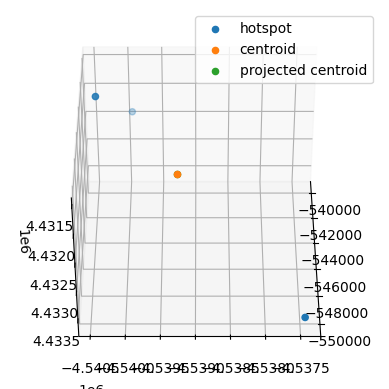

In [23]:
# plot an example
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter(hs_xyz_m[:,0].ravel(), hs_xyz_m[:,1].ravel(), hs_xyz_m[:,2].ravel(), label="hotspot")
ax.scatter(cartesian_centroid_xyz_m[0], cartesian_centroid_xyz_m[1], cartesian_centroid_xyz_m[2], label="centroid")
ax.scatter(projected_centroid_xyz_m[0], projected_centroid_xyz_m[1], projected_centroid_xyz_m[2], label="projected centroid")
plt.legend()
def animate(frame):
    ax.view_init(-140, frame)
ani = FuncAnimation(fig, animate, frames=100, interval=30)
HTML(ani.to_jshtml())